In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
WSL2024=pd.read_excel("C:/Users/theod/Desktop/SPORTS ANALYTICS/WSL/WSL2024.xlsx")

In [3]:
WSL2024.columns

Index(['Player', 'Squad', 'Foot', 'Height', 'Rk', 'Nation', 'Pos', 'Age',
       'Born', '90s',
       ...
       'Average Pass Length', 'Goal Kicks',
       'Percentage of Goal Kicks that were Launched',
       'Average length of goal kicks, in yards', 'Crosses Faced',
       'Crosses Stopped', 'Crosses Stopped %',
       'Def. Actions Outside Pen. Area',
       'Defensive actions outside of penalty area per 90 minutes',
       'Avg. Distance of Def. Actions'],
      dtype='object', length=173)

In [4]:
columns_to_drop = ['Assists_minus_xAG', 'Progressive_Passes_Received', 
                    'Save_Percentage', 'Penalty_Kicks_Saved', 
                    'PSxG_minus_GA_per_90']

In [5]:
WSL2024 = WSL2024.drop(columns=[col for col in columns_to_drop if col in WSL2024.columns])

In [6]:
WSL2024[['Goals', 'Assists','Shot-Creating Actions','Goal-Creating Actions','Crosses','Expected Assisted Goals','Progressive Passing Distance','Expected Assists','Key Passes','Passes into Final Third','Passes into Penalty Area','Crosses into Penalty Area','Touches (Att 3rd)','xG - Expected Goals']].corr

<bound method DataFrame.corr of      Goals  Assists  Shot-Creating Actions  Goal-Creating Actions  Crosses  \
0        0        1                      1                      0        2   
1        0        0                      0                      0        0   
2        0        0                      0                      0        0   
3        1        2                     27                      2       31   
4        0        0                      5                      0        0   
..     ...      ...                    ...                    ...      ...   
299      0        0                      1                      0        3   
300      1        6                    100                     11      145   
301      0        1                     28                      1       13   
302      0        0                      1                      0        0   
303      0        1                     26                      1        9   

     Expected Assisted Goals  P

In [7]:
corr_matrix = WSL2024[['Goals', 'Assists', 'Shot-Creating Actions', 'Goal-Creating Actions',
                       'Crosses', 'Expected Assisted Goals', 'Progressive Passing Distance',
                       'Expected Assists', 'Key Passes', 'Passes into Final Third',
                       'Passes into Penalty Area', 'Crosses into Penalty Area',
                       'Touches (Att 3rd)', 'xG - Expected Goals']].corr()

significant_corr = corr_matrix[(corr_matrix.abs() > 0.5) & (corr_matrix.abs() < 1)]


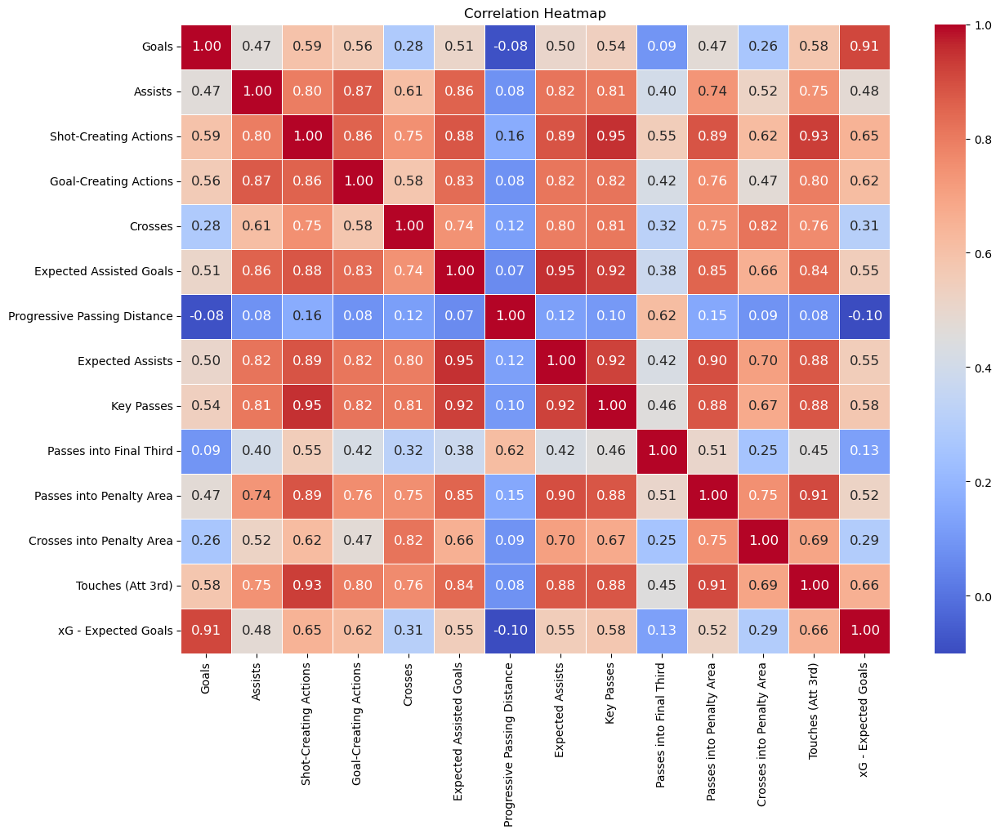

In [8]:
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, annot_kws={"size": 12}, cmap='coolwarm', linewidths=.5, fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


In [9]:
import numpy as np

In [10]:
# Define the columns of interest
columns_of_interest = [
'Goals', 'Assists', 'Shot-Creating Actions', 'Goal-Creating Actions',
                       'Crosses', 'Expected Assisted Goals', 'Progressive Passing Distance',
                       'Expected Assists', 'Key Passes', 'Passes into Final Third',
                       'Passes into Penalty Area', 'Crosses into Penalty Area',
                       'Touches (Att 3rd)', 'xG - Expected Goals'
]

In [11]:
# Function to calculate correlations within a squad
def calculate_squad_correlations(squad_df):
    # Select only the relevant columns for correlation analysis
    squad_data = squad_df[columns_of_interest]
    # Calculate the correlation matrix
    correlation_matrix = squad_data.corr()
    return correlation_matrix


In [12]:
# Group by squad and calculate correlations
squad_correlations = {}
for squad, squad_df in WSL2024.groupby('Squad'):
    squad_correlations[squad] = calculate_squad_correlations(squad_df)

In [13]:
# Print the correlations for each squad
for squad, corr_matrix in squad_correlations.items():
    print(f"Correlation matrix for {squad}:")
    print(corr_matrix)
    print("\n")

Correlation matrix for Arsenal:
                                 Goals   Assists  Shot-Creating Actions  \
Goals                         1.000000  0.508365               0.642763   
Assists                       0.508365  1.000000               0.866686   
Shot-Creating Actions         0.642763  0.866686               1.000000   
Goal-Creating Actions         0.559772  0.912066               0.900620   
Crosses                       0.435743  0.592567               0.805830   
Expected Assisted Goals       0.605993  0.858661               0.923006   
Progressive Passing Distance -0.124412  0.075097               0.258541   
Expected Assists              0.588740  0.886870               0.939796   
Key Passes                    0.652736  0.843837               0.969791   
Passes into Final Third      -0.070156  0.238461               0.377464   
Passes into Penalty Area      0.550846  0.803057               0.917804   
Crosses into Penalty Area     0.439117  0.464460               0.658

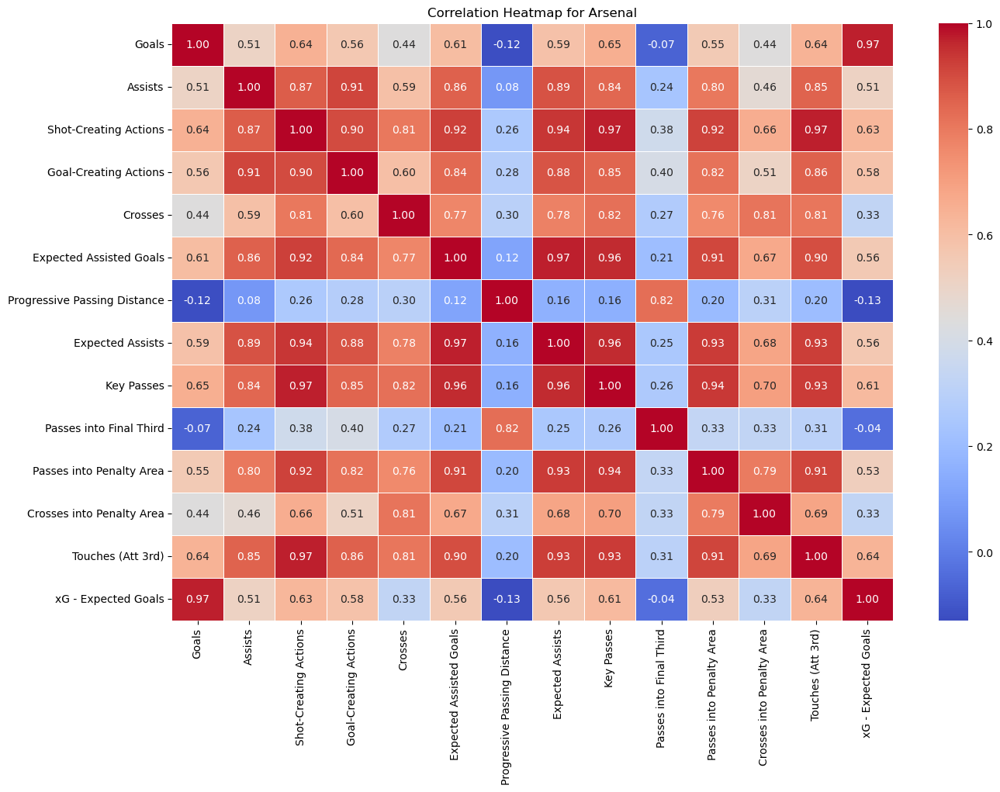

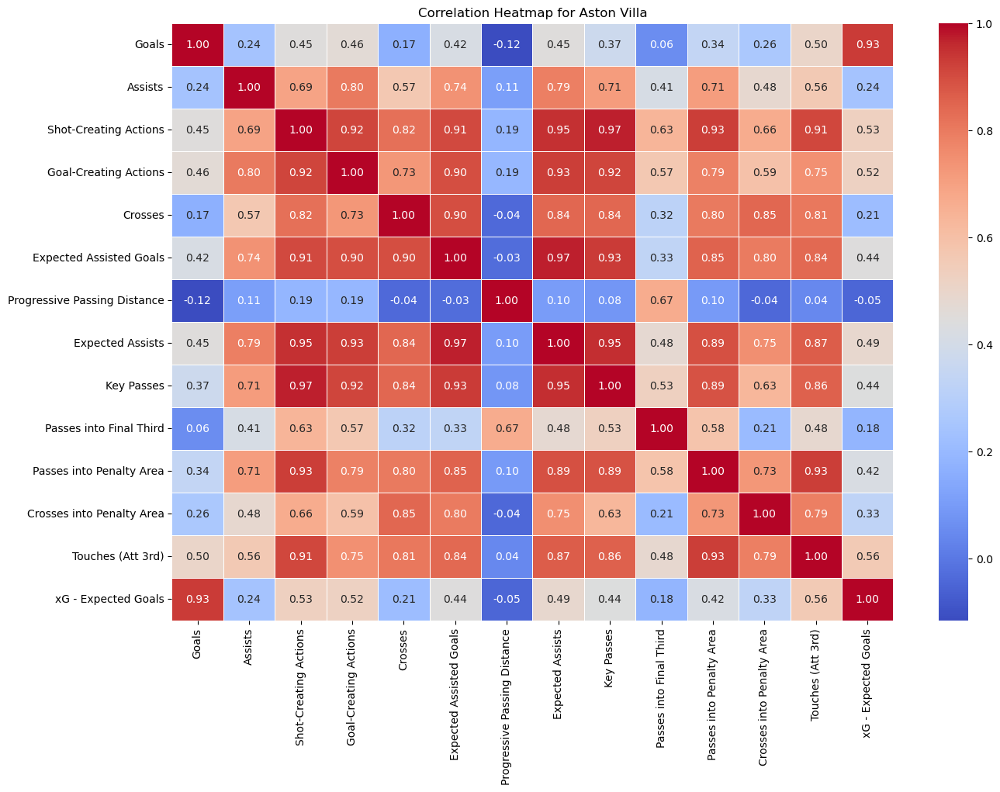

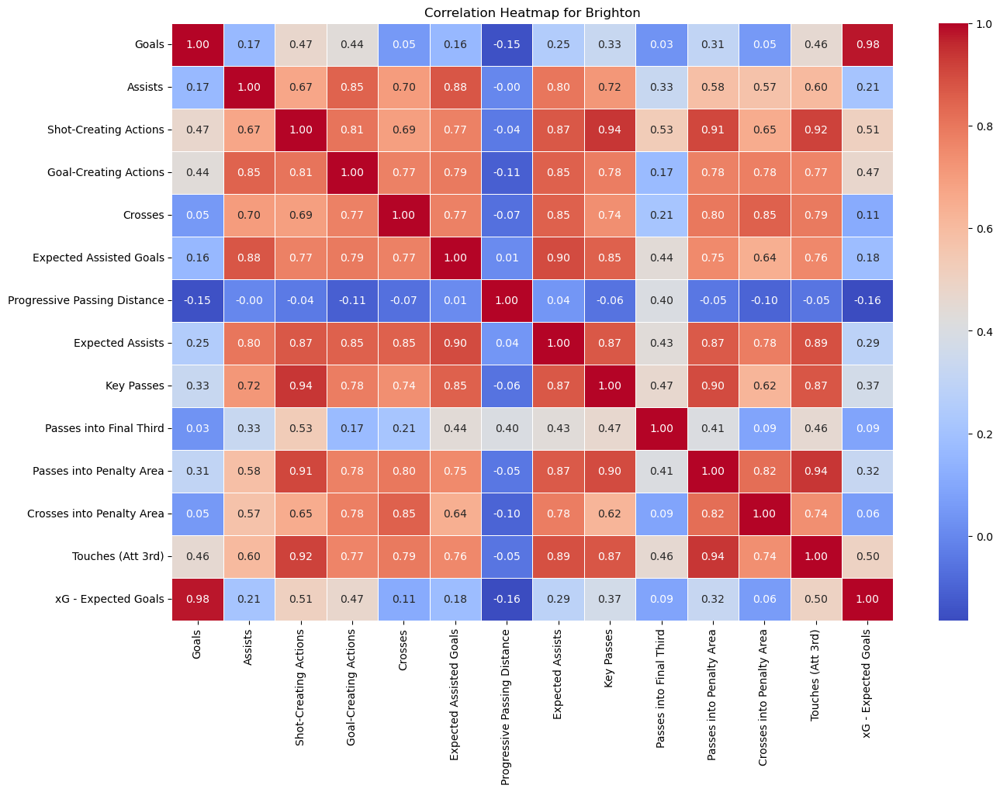

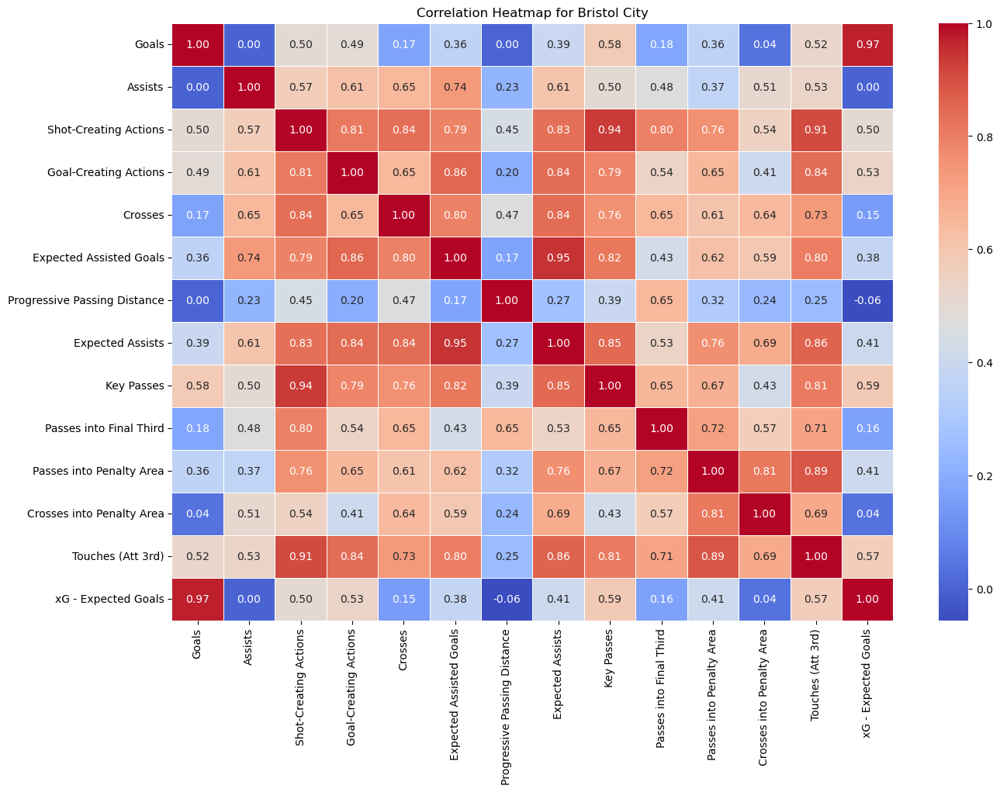

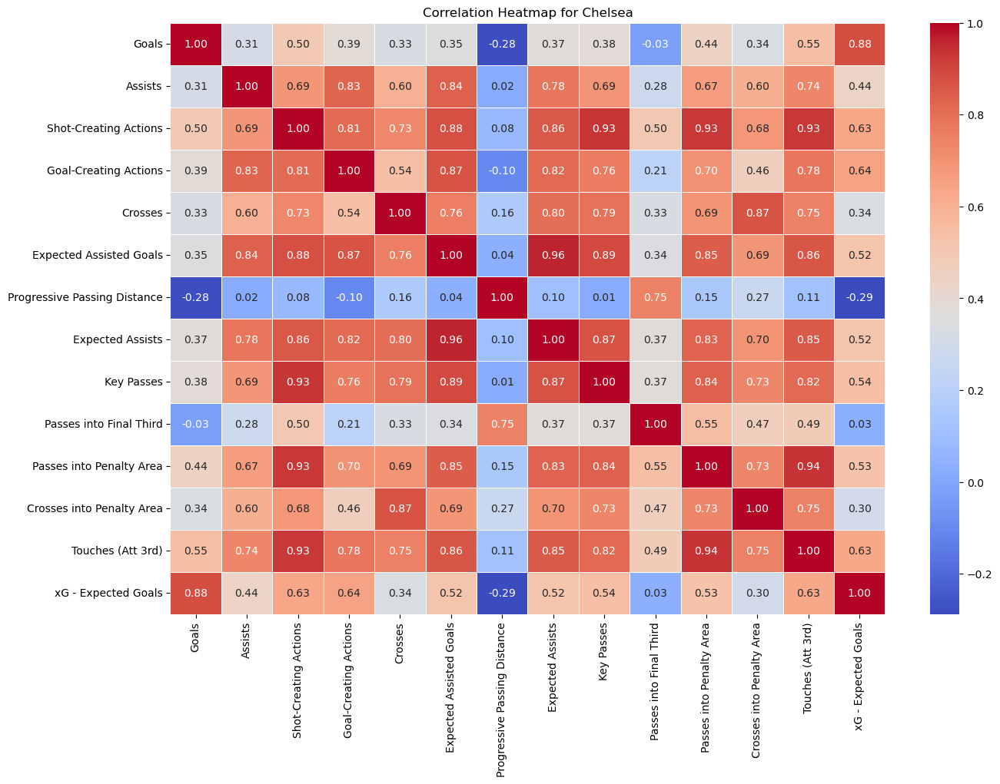

...

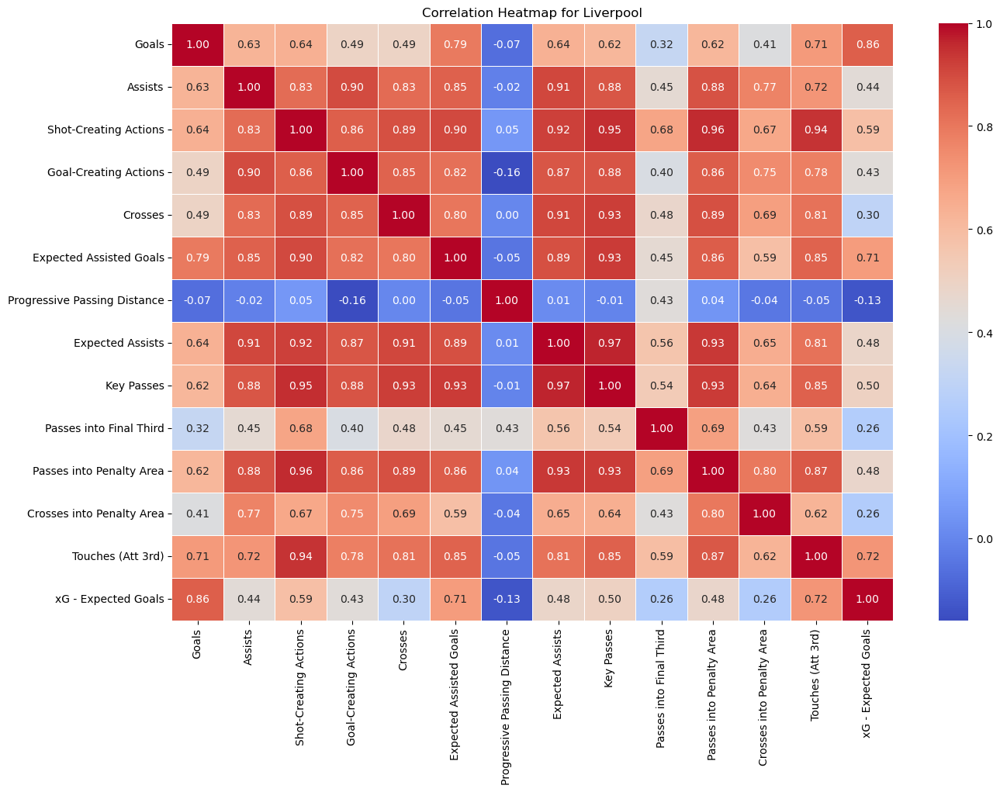

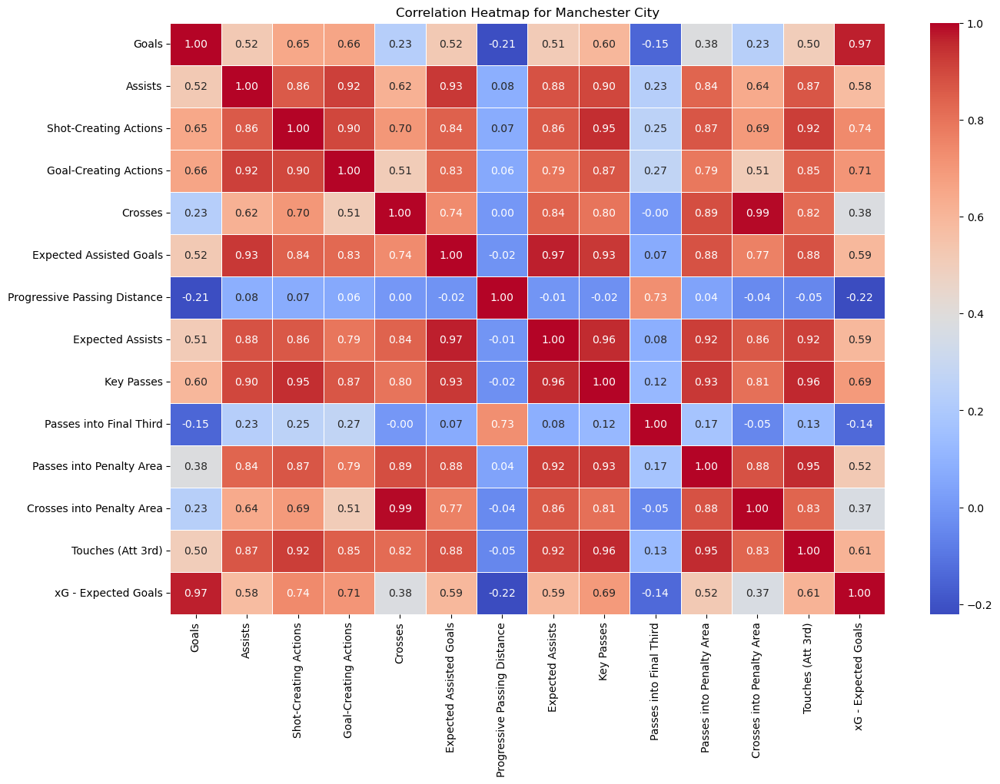

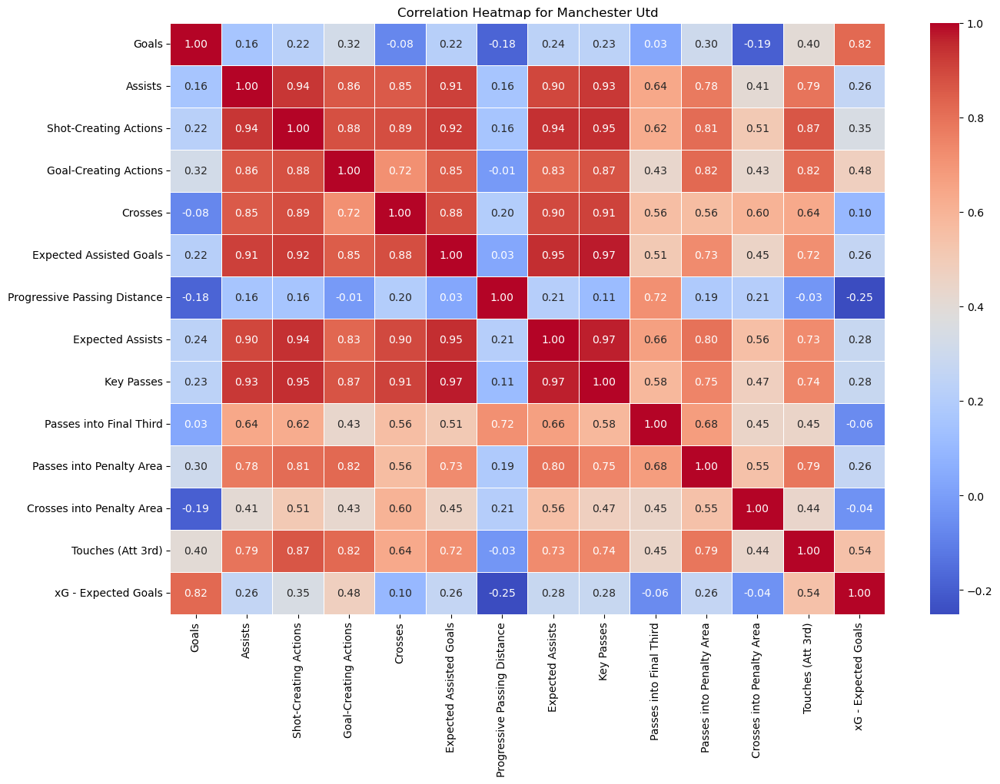

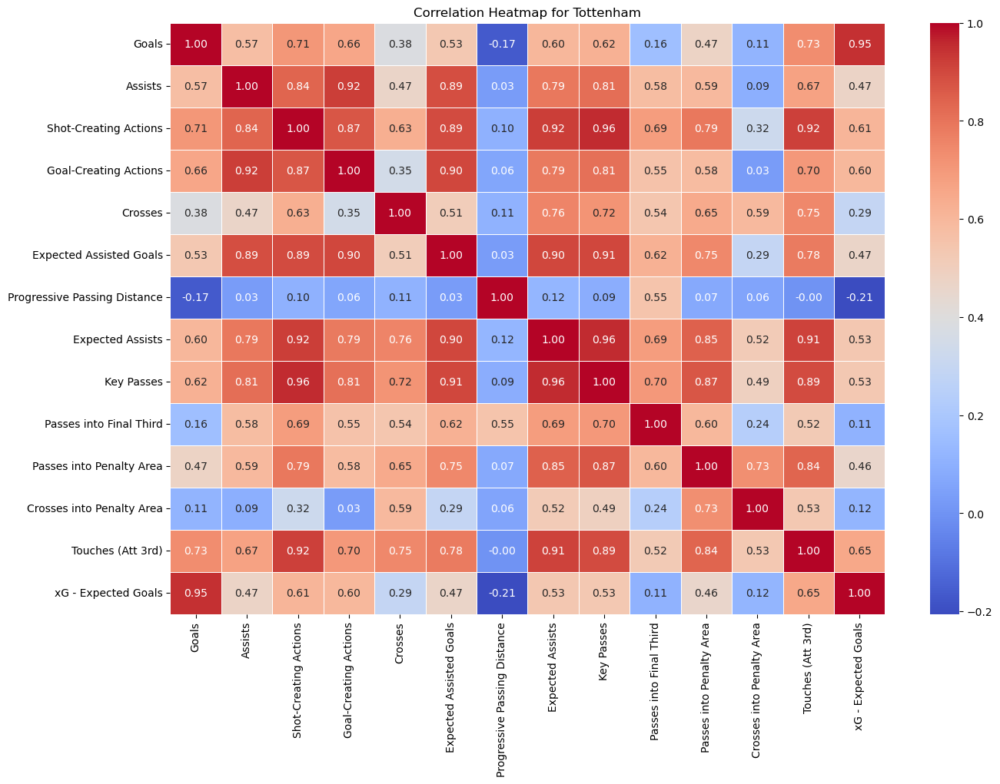

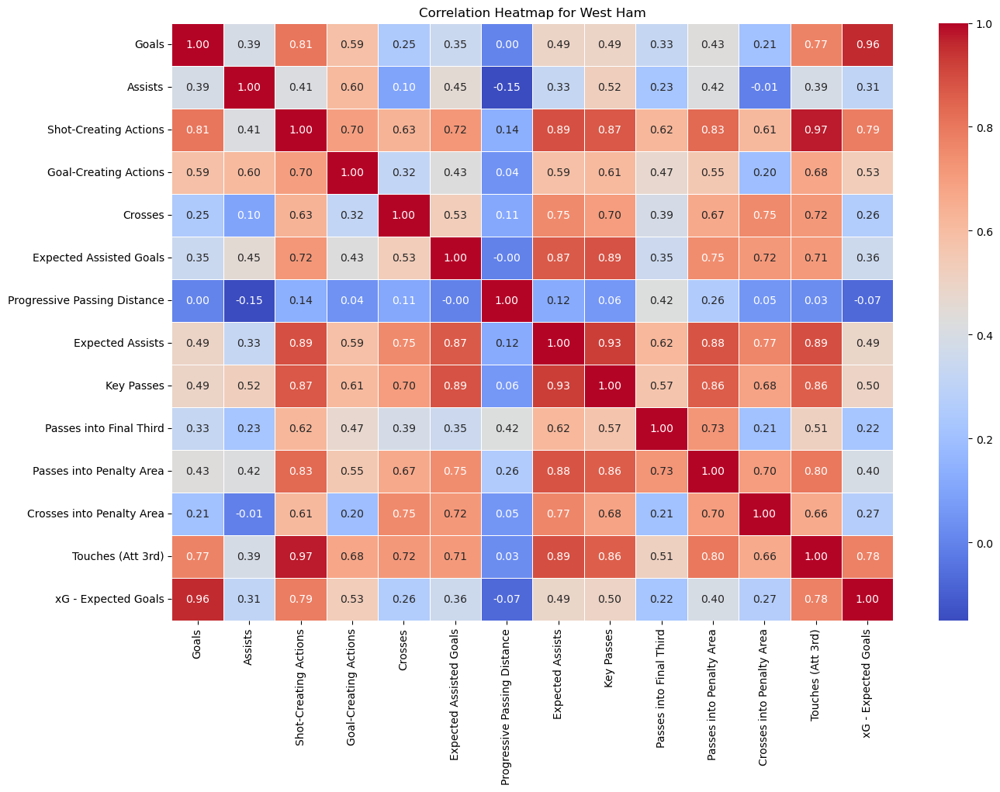

In [14]:

# Plot correlation heatmaps for each squad
for squad, corr_matrix in squad_correlations.items():
    plt.figure(figsize=(15, 10))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5, fmt='.2f')
    plt.title(f'Correlation Heatmap for {squad}')
    plt.show()

In [15]:
columns_of_interest1 = [
'Player','90s','Tackles', 'Tackles Won', 'Tackles (Def 3rd)', 'Tackles (Mid 3rd)', 
    'Tackles (Att 3rd)', 'Dribblers Tackled', 'Dribbles Challenged', 
    '% of Dribblers Tackled', 'Challenges Lost', 'Blocks', 'Shots Blocked', 
    'Passes Blocked', 'Interceptions', 'Tkl+Int', 'Clearances', 'Errors', 
    'Shot-Creating Actions', 'Shot-Creating Actions/90', 'SCA (Live-ball Pass)', 
    'SCA (Dead-ball Pass)', 'SCA (Take-On)', 'SCA (Shot)', 'SCA (Fouls Drawn)', 
    'SCA (Defensive Action)', 'Goal-Creating Actions', 'Goal-Creating Actions/90', 
    'GCA (Live-ball Pass)', 'GCA (Dead-ball Pass)', 'GCA (Take-On)', 'GCA (Shot)', 
    'GCA (Fouls Drawn)', 'GCA (Defensive Action)', 'CrdY', 'CrdR', '2CrdY', 
    'Fouls Committed', 'Fouls Drawn', 'Offsides', 'Crosses', 'Penalty Kicks Won', 
    'Penalty Kicks Conceded', 'Own Goals', 'Ball Recoveries', 'Aerials Won', 
    'Aerials Lost', '% of Aerials Won', 'Passes Completed', 'Passes Attempted', 
    'Pass Completion %', 'Total Passing Distance', 'Progressive Passing Distance', 
    'Passes Completed (Short)', 'Passes Attempted (Short)', 'Pass Completion % (Short)', 
    'Passes Completed (Medium)', 'Passes Attempted (Medium)', 'Pass Completion % (Medium)', 
    'Passes Completed (Long)', 'Passes Attempted (Long)', 'Pass Completion % (Long)', 
    'Assists', 'Expected Assisted Goals', 'Expected Assists', 'Key Passes', 
    'Passes into Final Third', 'Passes into Penalty Area', 'Crosses into Penalty Area', 
    'Progressive Passes', 'Touches', 'Touches (Def Pen)', 'Touches (Def 3rd)', 
    'Touches (Mid 3rd)', 'Touches (Att 3rd)', 'Touches (Att Pen)', 'Touches (Live-Ball)', 
    'Take-Ons Attempted', 'Successful Take-Ons', 'Successful Take-On %', 
    'Times Tackled During Take-On', 'Tackled During Take-On Percentage', 
    'Carries', 'Total Carrying Distance', 'Progressive Carrying Distance', 
    'Progressive Carries', 'Carries into Final Third', 'Carries into Penalty Area', 
    'Miscontrols', 'Dispossessed', 'Passes Received', 'Goals', 'Shots Total', 
    'Shots on Target', 'Shots on Target %', 'Shots Total/90', 'Shots on target/90', 
    'Goals/Shot', 'Goals/Shot on Target', 'Average Shot Distance', 'Shots from Free Kicks', 
    'Penalty Kicks Made', 'Penalty Kicks Attempted_x', 'xG - Expected Goals', 
    'Non-Penalty xG', 'npxG/Shot', 'Goals minus Expected Goals', 
    'Non-Penalty Goals minus Non-Penalty Expected Goals', 'Passes Attempted', 
    'Live-ball Passes', 'Dead-ball Passes', 'Passes from Free Kicks', 'Through Balls', 
    'Switches', 'Throw-ins Taken', 'Corner Kicks', 'Inswinging Corner Kicks', 
    'Outswinging Corner Kicks', 'Straight Corner Kicks', 'Passes Offside', 'MP', 
    'Starts', 'Min', 'Goals Against_x', 'Goals Against/90', 'Shots on Target Against', 
    'Saves', 'Wins', 'Draws', 'Losses', 'Clean Sheets', 'Clean Sheet Percentage', 
    'Penalty Kicks Attempted_y', 'Penalty Kicks Allowed_x', 'Penalty Kicks Missed', 
    'Save% (Penalty Kicks)', 'Goals Against_y', 'Penalty Kicks Allowed_y', 
    'Free Kick Goals Against', 'Corner Kick Goals Against', 
    'Own Goals Scored Against Goalkeeper', 'Post-Shot Expected Goals', 
    'Post-Shot Expected Goals per Shot on Target', 
    'Post-Shot Expected Goals minus Goals Allowed', 
    'Passes Completed (Launched)', 'Passes Attempted (Launched)', 
    'Pass Completion Percentage (Launched)', 'Passes Attempted (GK)', 
    'Throws Attempted', 'Percentage of Passes that were Launched', 
    'Average Pass Length', 'Goal Kicks', 'Percentage of Goal Kicks that were Launched', 
    'Average length of goal kicks, in yards', 'Crosses Faced', 'Crosses Stopped', 
    'Crosses Stopped %', 'Def. Actions Outside Pen. Area', 
    'Defensive actions outside of penalty area per 90 minutes', 
    'Avg. Distance of Def. Actions'
]

In [16]:
# # Function to calculate correlations within Players of a squad 
def calculate_player_correlations(squad_df):
    # Select only the relevant columns for correlation analysis
    squad_data = squad_df[columns_of_interest1]

    # Ορίστε τους παίκτες ως index
    squad_data.set_index('Player', inplace=True)
    
    # Calculate the correlation matrix
    correlation_matrix = squad_data.T.corr()  
    return correlation_matrix

In [17]:
# Group by squad and calculate correlations
player_correlations = {}
for squad, squad_df in WSL2024.groupby('Squad'):
    player_correlations[squad] = calculate_player_correlations(squad_df)


In [18]:
# Εκτυπώστε τις συσχετίσεις για κάθε ομάδα
for squad, corr_matrix in player_correlations.items():
    print(f"Correlation matrix for {squad}:")
    print(corr_matrix)
    print("\n")

Correlation matrix for Arsenal:
Player              Michelle Agyemang  Jennifer Beattie  Stina Blackstenius  \
Player                                                                        
Michelle Agyemang            1.000000          0.273002            0.295457   
Jennifer Beattie             0.273002          1.000000            0.875755   
Stina Blackstenius           0.295457          0.875755            1.000000   
Steph Catley                 0.236435          0.986660            0.927593   
Laia Codina                  0.249075          0.987573            0.928564   
Kyra Cooney-Cross            0.262083          0.967192            0.958358   
Sabrina D'Angelo             0.237454          0.972322            0.852149   
Caitlin Foord                0.258315          0.883480            0.991874   
Emily Fox                    0.245358          0.979927            0.943758   
Lina Hurtig                  0.510742          0.719340            0.809912   
Amanda Ilestedt     

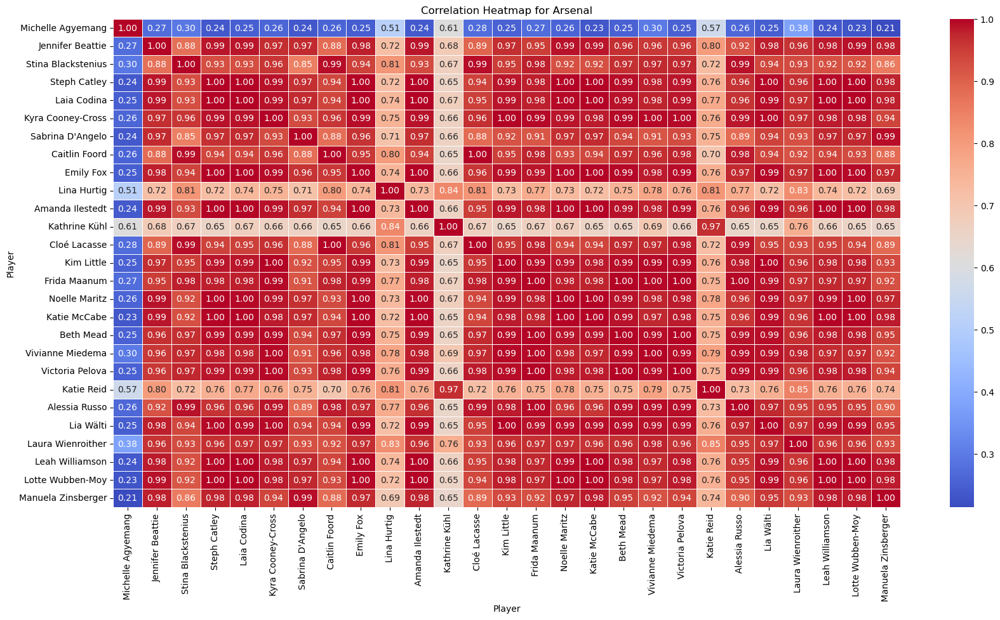

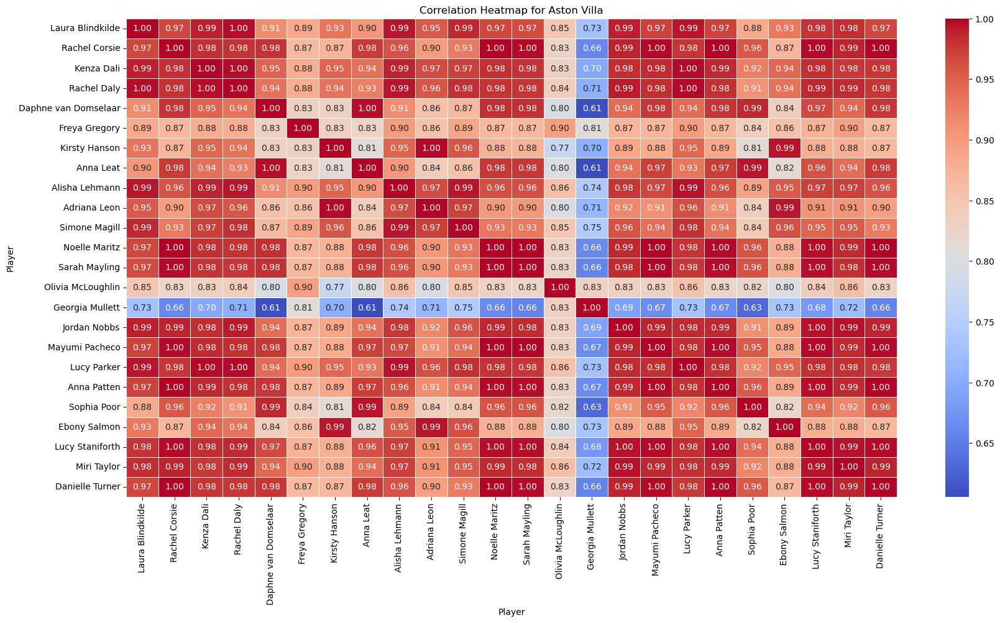

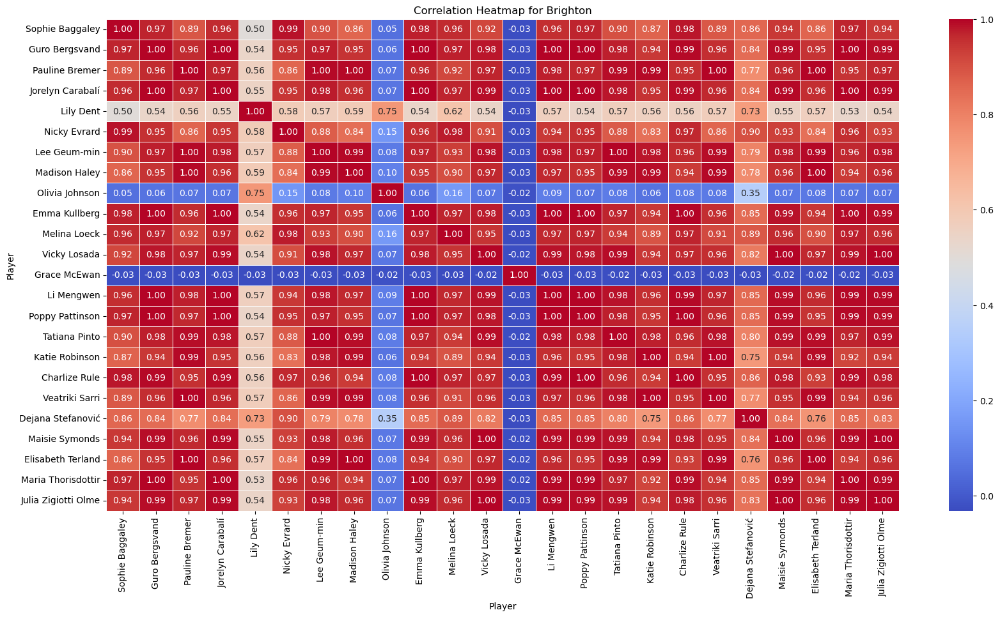

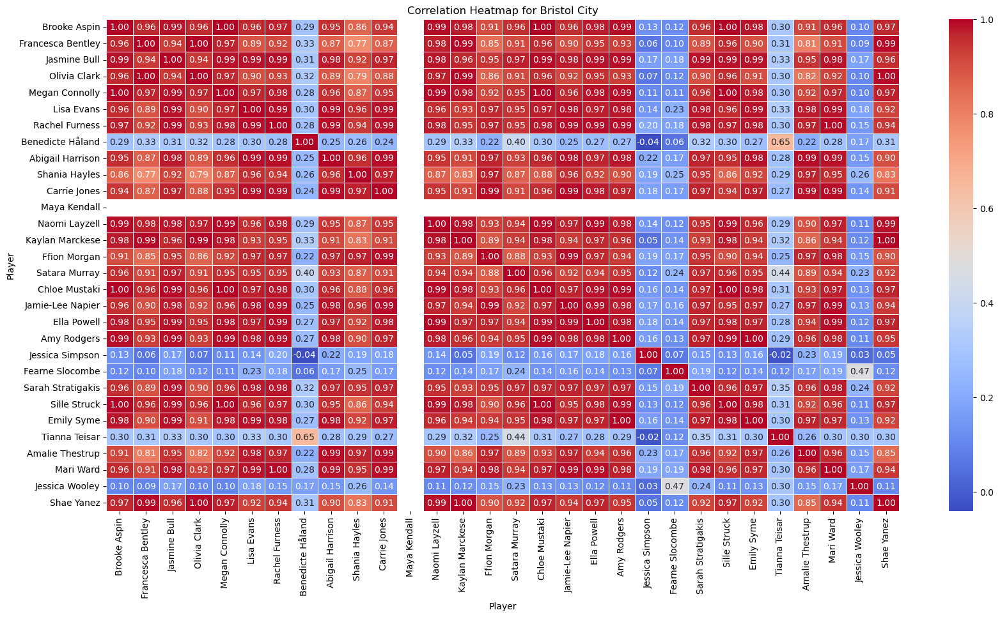

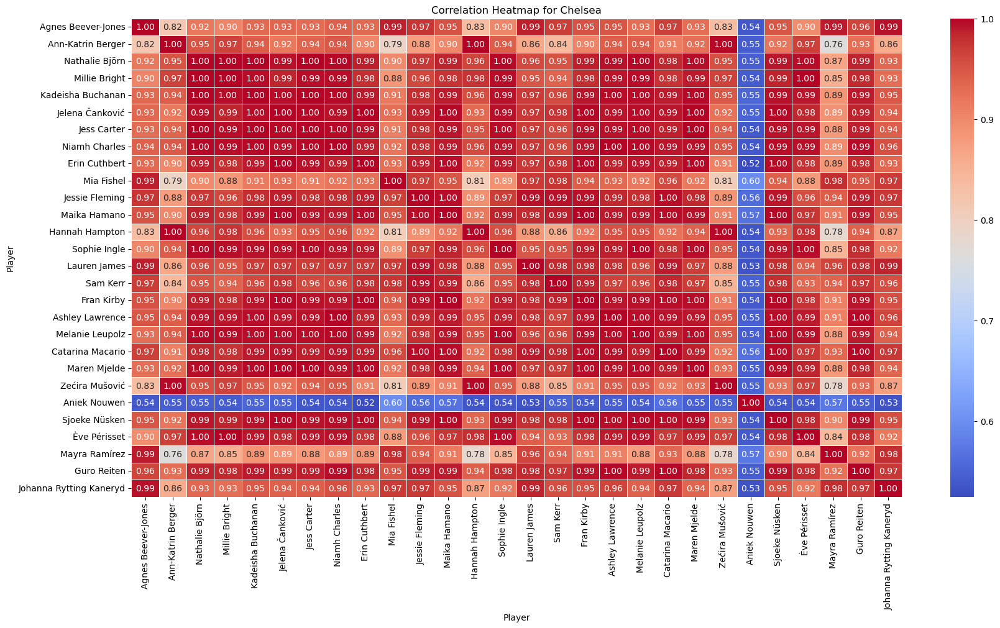

...

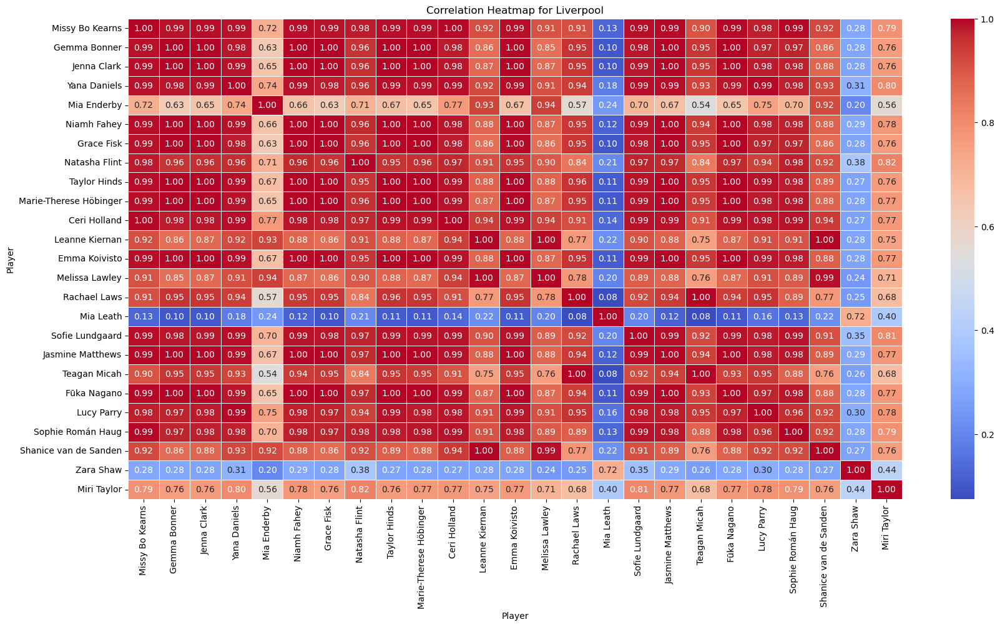

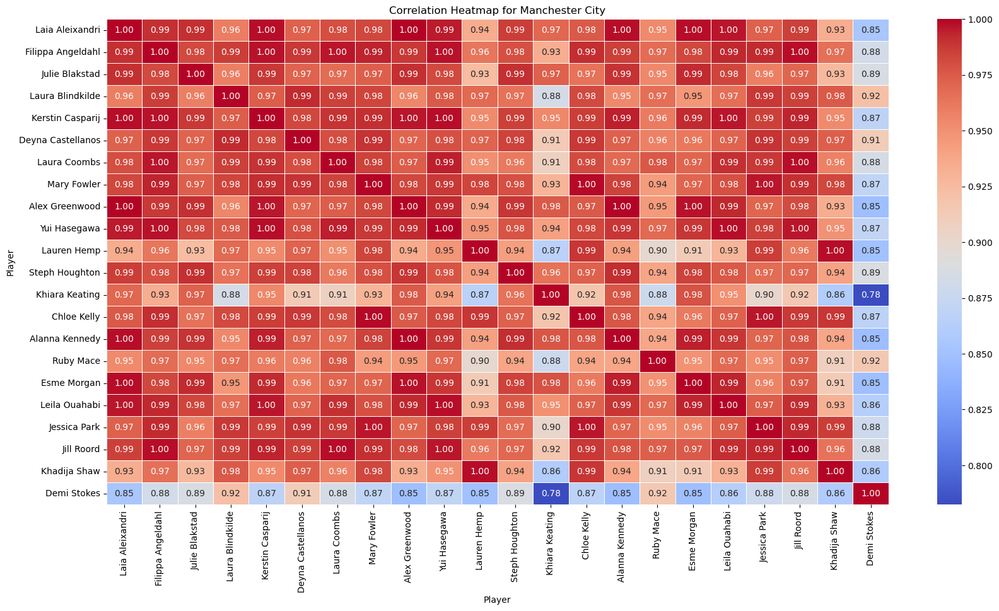

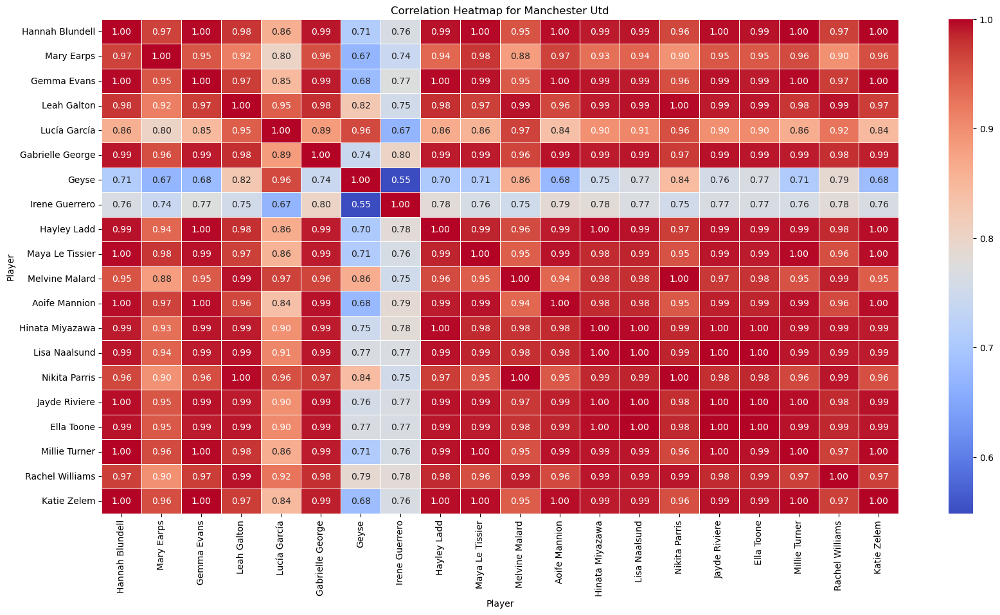

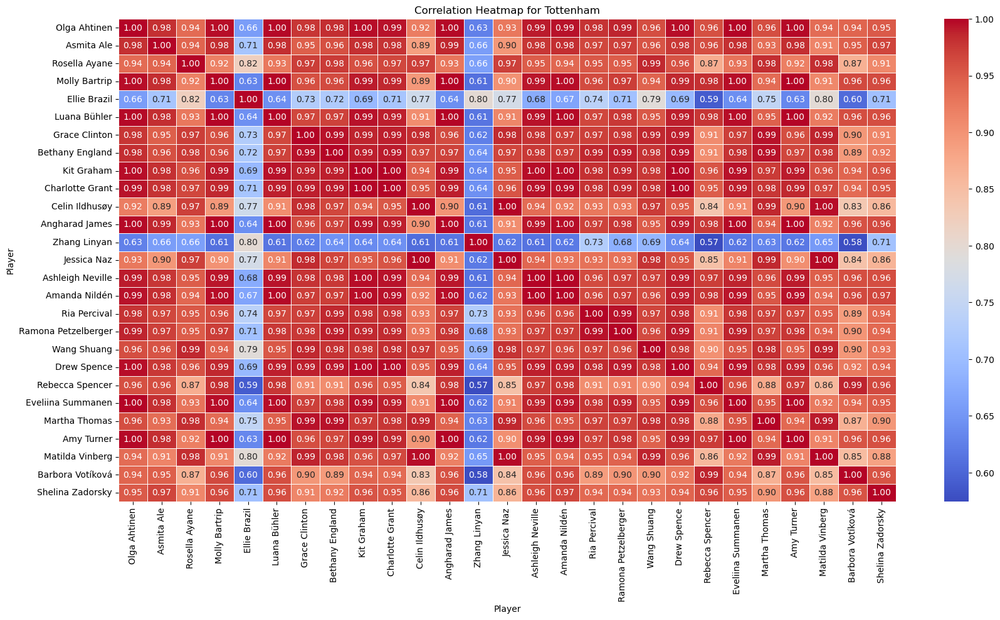

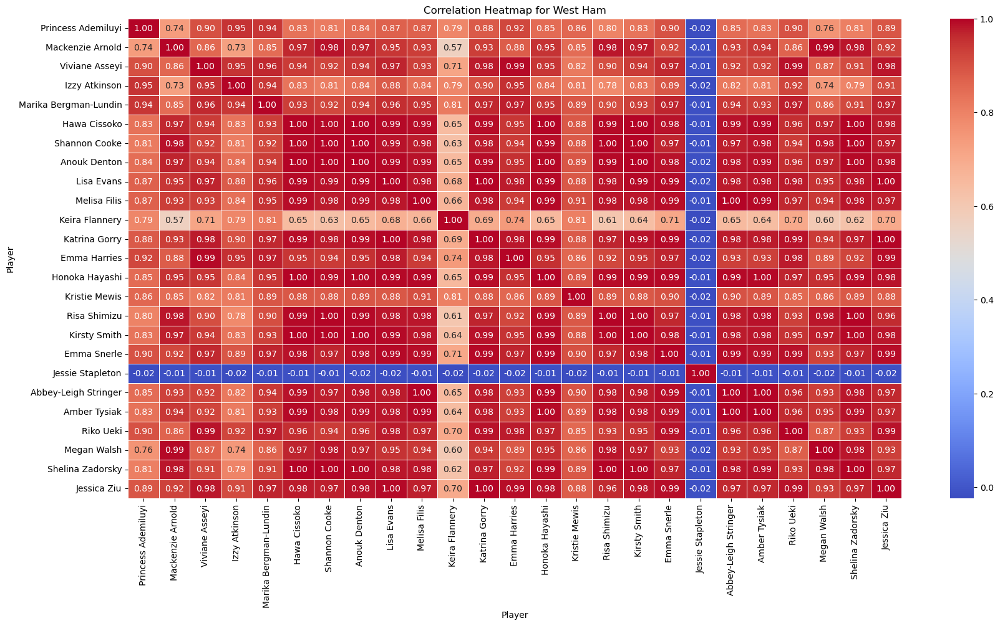

In [19]:
# Οπτικοποίηση heatmaps συσχετίσεων για κάθε ομάδα
for squad, corr_matrix in player_correlations.items():
    plt.figure(figsize=(20, 10))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5, fmt='.2f')
    plt.title(f'Correlation Heatmap for {squad}')
    plt.show()